# Predictive Analytics

## Preparation

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import plotly.express as px
import plotly.graph_objects as go

In [2]:
Rides = pd.read_csv("data/chicago_2018.csv", sep=",")

Rides["start_time"] = pd.to_datetime(Rides["start_time"])
Rides["end_time"] = pd.to_datetime(Rides["end_time"])

Rides.sort_values("start_time", inplace = True)
Rides.head(8)

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type
3215937,2018-01-01 00:12:00,2018-01-01 00:17:23,69,159,Damen Ave & Pierce Ave,Claremont Ave & Hirsch St,3304,Subscriber
3215938,2018-01-01 00:41:35,2018-01-01 00:47:52,253,325,Winthrop Ave & Lawrence Ave,Clark St & Winnemac Ave (Temp),5367,Subscriber
3215939,2018-01-01 00:44:46,2018-01-01 01:33:10,98,509,LaSalle St & Washington St,Troy St & North Ave,4599,Subscriber
3215940,2018-01-01 00:53:10,2018-01-01 01:05:37,125,364,Rush St & Hubbard St,Larrabee St & Oak St,2302,Subscriber
3215941,2018-01-01 00:53:37,2018-01-01 00:56:40,129,205,Blue Island Ave & 18th St,Paulina St & 18th St,3696,Subscriber
3215942,2018-01-01 00:56:15,2018-01-01 01:00:41,304,299,Broadway & Waveland Ave,Halsted St & Roscoe St,6298,Subscriber
3215943,2018-01-01 00:57:26,2018-01-01 01:02:40,164,174,Franklin St & Lake St,Canal St & Madison St,1169,Subscriber
3215944,2018-01-01 01:00:29,2018-01-01 01:13:43,182,142,Wells St & Elm St,McClurg Ct & Erie St,6351,Subscriber


The following cell is just for double checking the aggregated, hourly rental counts.

In [3]:
date1 = datetime.datetime(year=2018, month=1, day=1, hour = 5)
date2 = datetime.datetime(year=2018, month=1, day=1, hour = 6)

Rides[(Rides["start_time"] >= date1) & (Rides["start_time"] <= date2)]

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type
3215973,2018-01-01 05:32:22,2018-01-01 05:40:04,206,339,Halsted St & Archer Ave,Emerald Ave & 31st St,540,Subscriber
3215974,2018-01-01 05:46:51,2018-01-01 05:58:48,72,36,Wabash Ave & 16th St,Franklin St & Jackson Blvd,3775,Subscriber
3215975,2018-01-01 05:48:40,2018-01-01 05:53:01,303,296,Broadway & Cornelia Ave,Broadway & Belmont Ave,4784,Subscriber


Computing the hourly demand for 2018. The result is stored in a DataFrame of 24 by 365 = 8760 rows, neglecting time change

In [4]:
date_index = date1 + pd.to_timedelta(np.arange(8760), 'H')

Features = pd.DataFrame(index = date_index)

Features["demand"] = 0

Features = Rides.set_index("start_time")
Features = Features.resample('H').count()

Features.drop(columns = "start_station_id", inplace = True)
Features.drop(columns = "end_station_id", inplace = True)
Features.drop(columns = "start_station_name", inplace = True)
Features.drop(columns = "end_station_name", inplace = True)
Features.drop(columns = "bike_id", inplace = True)
Features.drop(columns = "user_type", inplace = True)

Features.rename(columns = {"end_time": "Rides"}, inplace = True)

The resulting df can be double checked with one of the cells above or with the sorted Rides df. It seems reasonable though:

In [5]:
Features.describe()

,Rides
count,8760.000000
mean,411.310731
std,479.667282
min,0.000000
25%,55.000000
50%,225.000000
75%,611.250000
max,2829.000000


In [6]:
Features.head()

,Rides
start_time,
2018-01-01 00:00:00,7
2018-01-01 01:00:00,15
2018-01-01 02:00:00,10
2018-01-01 03:00:00,2
2018-01-01 04:00:00,2


In [7]:
x = Features.iloc[0]["Rides"]
x

7

In [8]:
Features["Rides_last_hour"] = 0
value = Features.iloc[0]["Rides"]
for i in Features.index:     
        Features.loc[i,"Rides_last_hour"] = value
        value = Features.loc[i]["Rides"]

There seems to be some erroneous data in the weather data set as there are rows which exhibit the same date, leading pandas to crash. (e.g. for index 1662, if duplicates were not removed.)

In [9]:
Weather = pd.read_csv("data/weather_hourly_chicago.csv", sep=",")

Weather["avg_tmp"] = (Weather["max_temp"]+Weather["min_temp"])/2
Weather["is_raining"] = Weather["precip"] == 1
Weather.drop(columns = ["max_temp", "min_temp"], inplace=True)

Weather["date_time"] = pd.to_datetime(Weather["date_time"])

Weather.set_index("date_time", inplace = True)
Features = Features.join(Weather, on="start_time")

**Replace erroneous data**

Lots of missing values for weather, imputation methods:

* numerical values: linear interpolation (time series data)
* categorical (is_raining): backwards-fill

In [10]:
Features.interpolate(inplace=True)
Features.fillna(method="bfill",inplace=True)

In [11]:
Features.describe()

,Rides,Rides_last_hour,precip,avg_tmp
count,9361.000000,9361.000000,9361.000000,9361.000000
mean,405.986754,405.733255,0.110832,10.460314
std,474.935071,475.283195,0.309356,11.814070
min,0.000000,0.000000,0.000000,-22.800000
25%,54.000000,54.000000,0.000000,1.100000
50%,222.000000,221.000000,0.000000,9.400000
75%,605.000000,603.000000,0.000000,21.100000
max,2829.000000,2829.000000,1.000000,36.100000


In [12]:
Features.reset_index(inplace=True)

In [13]:
Features["is_workday"] = Features["start_time"].apply(lambda x: x.weekday() < 5)
Features["hour"] = Features["start_time"].apply(lambda x: x.hour)
Features["month"] = Features["start_time"].apply(lambda x: x.month)

In [14]:
def getSeason(month):
    
    Winter = [12, 1, 2]
    Spring = [3, 4, 5]
    Summer = [6, 7, 8]
    Fall = [9, 10, 11]
    
    if month in Winter:
        return 1
    elif month in Spring:
        return 2
    elif month in Summer:
        return 3
    elif month in Fall:
        return 4
    
Features["season"] = Features["month"].apply(lambda month: getSeason(month))

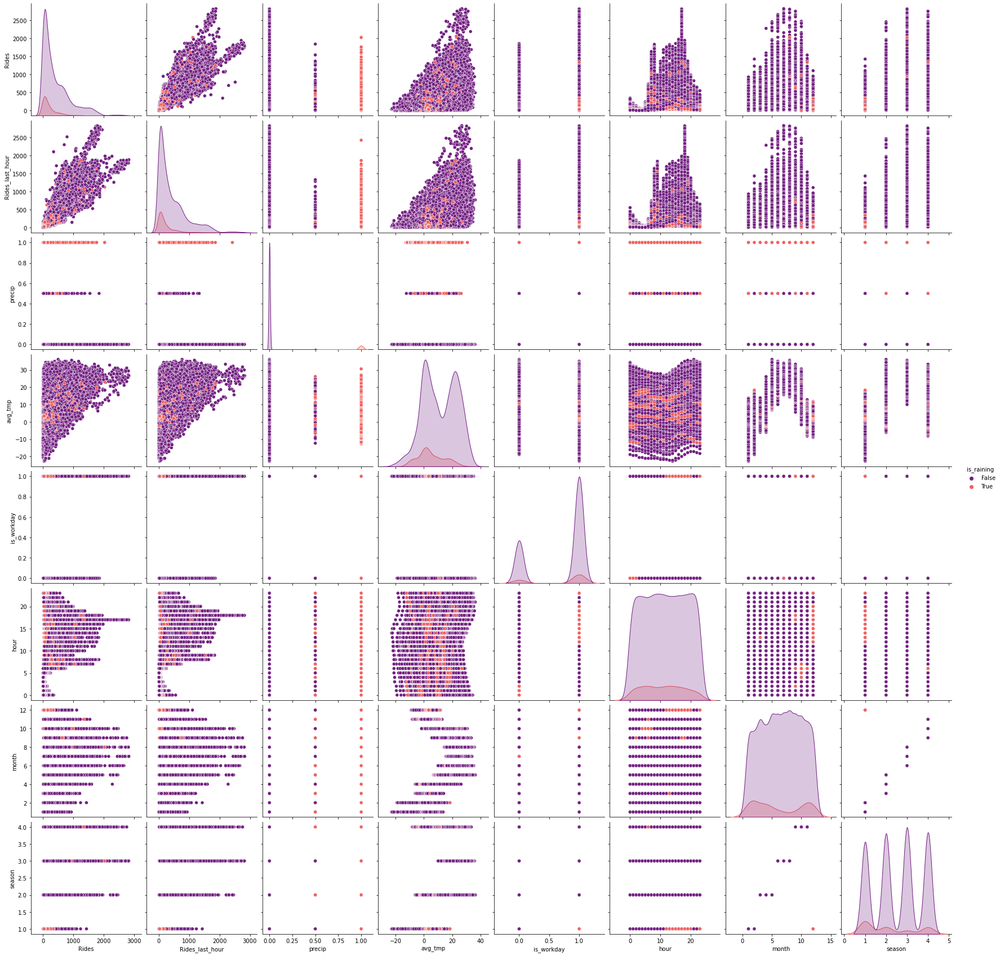

In [15]:
sns.pairplot(Features, palette="magma", height=3, hue="is_raining")
plt.show()

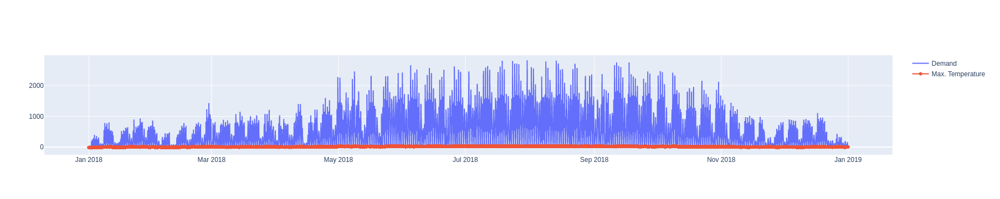

In [16]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=Features["start_time"], y=Features["Rides"],
                    mode='lines',
                    name='Demand'))
fig.add_trace(go.Scatter(x=Features["start_time"], y=Features["avg_tmp"],
                    mode='lines+markers',
                    name='Max. Temperature'))

fig.show()

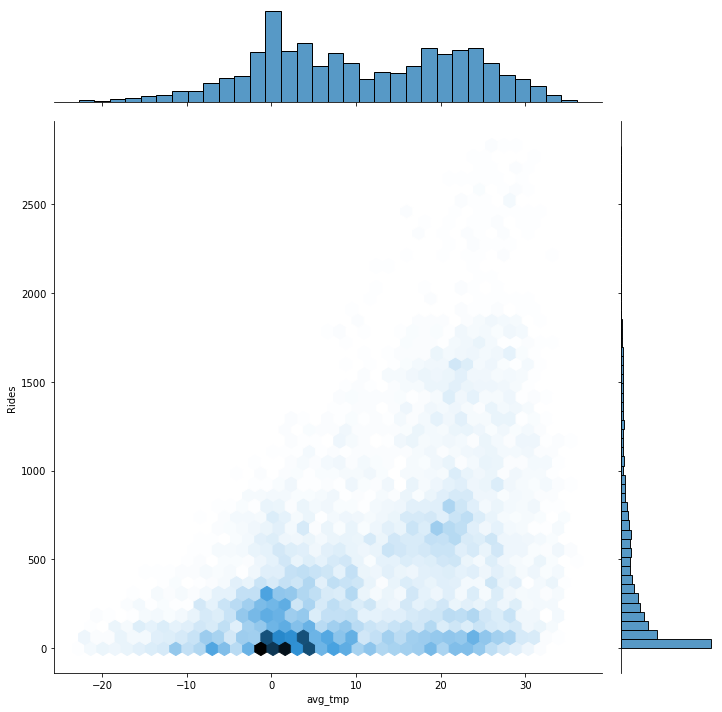

In [17]:
sns.jointplot(x = "avg_tmp", y = "Rides", data = Features, kind = "hex", height=10, palette = "magma")

In [18]:
Features.cov()

,Rides,Rides_last_hour,precip,avg_tmp,is_raining,is_workday,hour,month,season
Rides,225563.321406,192883.046680,-19.582453,2497.967648,-19.802826,20.452841,890.644545,194.518663,145.539937
Rides_last_hour,192883.046680,225894.115485,-21.564023,2652.123916,-21.530355,20.297542,1190.709434,195.047948,145.799106
precip,-19.582453,-21.564023,0.095701,-0.600506,0.095098,0.000882,-0.055208,-0.051648,-0.040934
avg_tmp,2497.967648,2652.123916,-0.600506,139.572241,-0.591888,0.124580,7.687642,9.319458,6.564482
is_raining,-19.802826,-21.530355,0.095098,-0.591888,0.097351,0.000867,-0.053527,-0.047664,-0.039414
is_workday,20.452841,20.297542,0.000882,0.124580,0.000867,0.204031,0.009532,-0.024953,0.003564
hour,890.644545,1190.709434,-0.055208,7.687642,-0.053527,0.009532,47.808787,0.031348,-0.017068
month,194.518663,195.047948,-0.051648,9.319458,-0.047664,-0.024953,0.031348,12.019113,2.214829
season,145.539937,145.799106,-0.040934,6.564482,-0.039414,0.003564,-0.017068,2.214829,1.253870


In [19]:
Features_corr = Features.corr()
Features_corr

,Rides,Rides_last_hour,precip,avg_tmp,is_raining,is_workday,hour,month,season
Rides,1.000000,0.854491,-0.133283,0.445198,-0.133636,0.095339,0.271217,0.118138,0.273666
Rides_last_hour,0.854491,1.000000,-0.146662,0.472326,-0.145187,0.094546,0.362326,0.118373,0.273953
precip,-0.133283,-0.146662,1.000000,-0.164308,0.985245,0.006311,-0.025810,-0.048157,-0.118168
avg_tmp,0.445198,0.472326,-0.164308,1.000000,-0.160572,0.023345,0.094111,0.227539,0.496220
is_raining,-0.133636,-0.145187,0.985245,-0.160572,1.000000,0.006151,-0.024811,-0.044064,-0.112812
is_workday,0.095339,0.094546,0.006311,0.023345,0.006151,1.000000,0.003052,-0.015934,0.007046
hour,0.271217,0.362326,-0.025810,0.094111,-0.024811,0.003052,1.000000,0.001308,-0.002204
month,0.118138,0.118373,-0.048157,0.227539,-0.044064,-0.015934,0.001308,1.000000,0.570529
season,0.273666,0.273953,-0.118168,0.496220,-0.112812,0.007046,-0.002204,0.570529,1.000000


<AxesSubplot:>

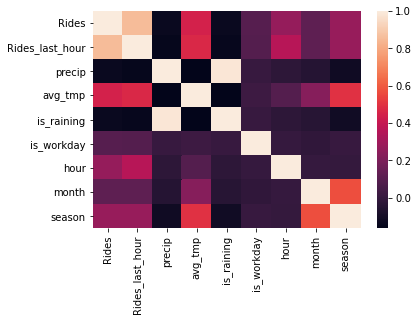

In [20]:
sns.heatmap(Features_corr, 
        xticklabels=Features_corr.columns,
        yticklabels=Features_corr.columns)

[Source](https://stackoverflow.com/questions/39409866/correlation-heatmap) for the following code:

In [21]:
cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)

def magnify():
    return [dict(selector="th",
                 props=[("font-size", "7pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "12pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '200px'),
                        ('font-size', '12pt')])
]

Features_corr.style.background_gradient(cmap, axis=1)\
    .set_properties(**{'max-width': '80px', 'font-size': '10pt'})\
    .set_caption("Hover to magify")\
    .set_precision(2)\
    .set_table_styles(magnify())

,Rides,Rides_last_hour,precip,avg_tmp,is_raining,is_workday,hour,month,season
Rides,1.00,0.85,-0.13,0.45,-0.13,0.10,0.27,0.12,0.27
Rides_last_hour,0.85,1.00,-0.15,0.47,-0.15,0.09,0.36,0.12,0.27
precip,-0.13,-0.15,1.00,-0.16,0.99,0.01,-0.03,-0.05,-0.12
avg_tmp,0.45,0.47,-0.16,1.00,-0.16,0.02,0.09,0.23,0.50
is_raining,-0.13,-0.15,0.99,-0.16,1.00,0.01,-0.02,-0.04,-0.11
is_workday,0.10,0.09,0.01,0.02,0.01,1.00,0.00,-0.02,0.01
hour,0.27,0.36,-0.03,0.09,-0.02,0.00,1.00,0.00,-0.00
month,0.12,0.12,-0.05,0.23,-0.04,-0.02,0.00,1.00,0.57
season,0.27,0.27,-0.12,0.50,-0.11,0.01,-0.00,0.57,1.00


<ipython-input-22-e16c00059b17>:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



<AxesSubplot:xlabel='avg_tmp', ylabel='Rides'>

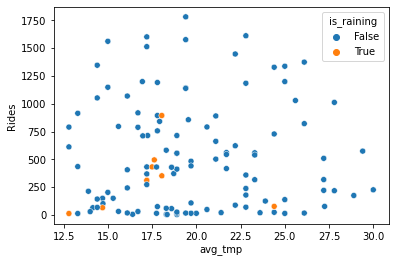

In [22]:
Features_sample = Features[3100:3220]
Features_sample = Features_sample[Features["avg_tmp"] != 0]
#Features_sample = Features.sample(n=125)
#Features_sample = Features_sample[Features["Max_temp"] != 0]

sns.scatterplot(x = Features_sample["avg_tmp"], y = Features_sample["Rides"], hue = Features_sample["is_raining"])

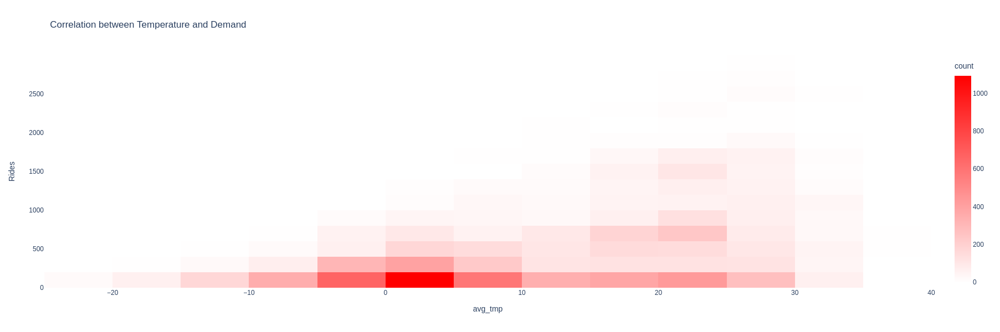

In [23]:
fig = px.density_heatmap(Features, x='avg_tmp', y='Rides', width=600, height=600,
                      title='Correlation between Temperature and Demand', color_continuous_scale=[[0.0, 'white'], [1.0, 'red']],
                        nbinsx=25, nbinsy=25)
fig.show()

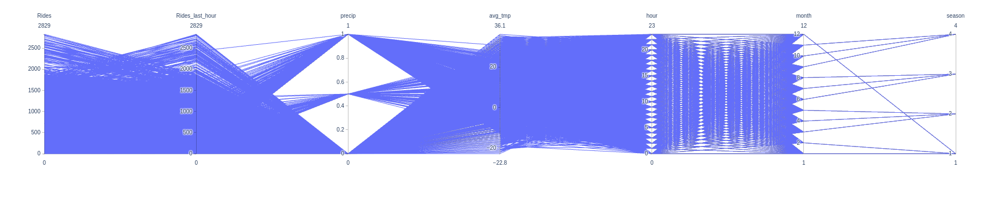

In [24]:
fig = px.parallel_coordinates(data_frame = Features)

fig.show()

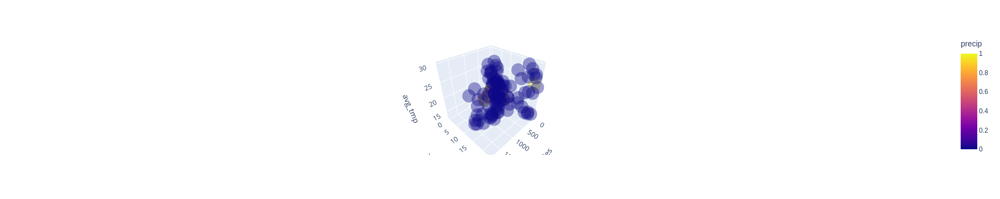

In [25]:
fig = px.scatter_3d(data_frame = Features_sample, z='avg_tmp', x='Rides', y='hour', color='precip', opacity=0.4, size_max=5)

fig.show()

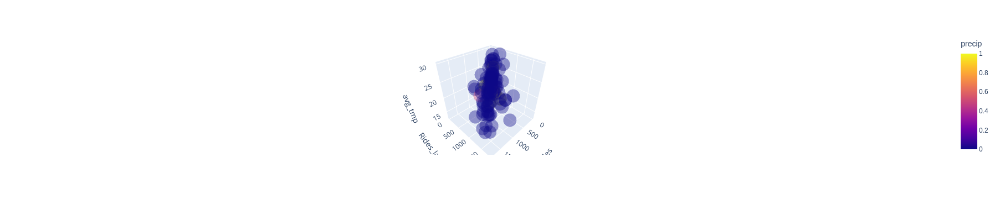

In [26]:
fig = px.scatter_3d(data_frame = Features_sample, z='avg_tmp', x='Rides', y='Rides_last_hour', color='precip', opacity=0.4, size_max=5)

fig.show()

In [27]:
seasons = pd.get_dummies(Features["season"],prefix="season_")
seasons.drop(columns="season__4", inplace=True)

In [28]:
Features[list(seasons.columns)] = seasons

In [29]:
hours = pd.get_dummies(Features["hour"],prefix="hour_")
hours.drop(columns="hour__23", inplace=True)

In [30]:
Features[list(hours.columns)] = hours

In [31]:
Features.drop(columns=["season","month","hour", "precip"], inplace=True)

In [32]:
Features

,start_time,Rides,Rides_last_hour,avg_tmp,is_raining,is_workday,season__1,season__2,season__3,hour__0,...,hour__13,hour__14,hour__15,hour__16,hour__17,hour__18,hour__19,hour__20,hour__21,hour__22
0,2018-01-01 00:00:00,7,7,-13.90,False,True,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,2018-01-01 01:00:00,15,7,-15.00,False,True,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2018-01-01 02:00:00,10,15,-15.60,False,True,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2018-01-01 03:00:00,2,10,-16.70,False,True,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2018-01-01 04:00:00,2,2,-17.20,False,True,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9356,2018-12-31 19:00:00,41,45,3.30,True,True,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
9357,2018-12-31 20:00:00,28,41,3.60,True,True,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9358,2018-12-31 21:00:00,22,28,3.45,False,True,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9359,2018-12-31 22:00:00,25,22,3.30,False,True,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1


# Modeling

Now that we have a Feature List we can start to fit models onto that set, but first we also create a normalized set to enable some more advanced regression models

In [33]:
Features_Normalized = Features.copy()
def normalize(key):
    Features_Normalized[key] = (Features_Normalized[key] - Features_Normalized[key].min()) / (Features_Normalized[key].max() - Features_Normalized[key].min())

normalize("Rides_last_hour")
normalize("avg_tmp")

Features_Normalized["is_raining"] = Features_Normalized["is_raining"].apply(lambda x: 1 if x == True else 0)
Features_Normalized["is_workday"] = Features_Normalized["is_workday"].apply(lambda x: 1 if x == True else 0)

Features_Normalized.head()

,start_time,Rides,Rides_last_hour,avg_tmp,is_raining,is_workday,season__1,season__2,season__3,hour__0,...,hour__13,hour__14,hour__15,hour__16,hour__17,hour__18,hour__19,hour__20,hour__21,hour__22
0,2018-01-01 00:00:00,7,0.002474,0.151104,0,1,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,2018-01-01 01:00:00,15,0.002474,0.132428,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2018-01-01 02:00:00,10,0.005302,0.122241,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2018-01-01 03:00:00,2,0.003535,0.103565,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2018-01-01 04:00:00,2,0.000707,0.095076,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [34]:
from sklearn.model_selection import train_test_split

## Multi-dimensional linear regression

Let's now try to train a mulit-dimensional linear model. But first of all, we need to import a few missing libraries.

In [35]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In order to be able to use sklearn, we need to eliminate booleans in our data first.

In [36]:
def workday_check (dt):
    if dt == True:
        return 1
    else:
        return 0

Features["is_workday"] = Features["is_workday"].apply(lambda dt: workday_check(dt))

def raining_check (dt):
    if dt == True:
        return 1
    else:
        return 0

Features["is_raining"] = Features["is_raining"].apply(lambda dt: raining_check(dt))

In [37]:
# split the data with 70-30% split as above

X = Features[Features.columns[(Features.columns != "Rides") & (Features.columns != "start_time")]]
y = Features[["Rides"]]
X,y
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=42)
X

,Rides_last_hour,avg_tmp,is_raining,is_workday,season__1,season__2,season__3,hour__0,hour__1,hour__2,...,hour__13,hour__14,hour__15,hour__16,hour__17,hour__18,hour__19,hour__20,hour__21,hour__22
0,7,-13.90,0,1,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,7,-15.00,0,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2,15,-15.60,0,1,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,10,-16.70,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2,-17.20,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9356,45,3.30,1,1,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
9357,41,3.60,1,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9358,28,3.45,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9359,22,3.30,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


Now the same for average temperature and precipitation

In [38]:
x_train2 = x_train[["is_raining","avg_tmp"]]  #Fist select only two features for the sake of simlicity
lin_mod_day = LinearRegression()
lin_mod_day.fit(x_train2,y_train)
print(lin_mod_day.coef_, lin_mod_day.intercept_)

print()

[[-102.38174016   17.27035431]] [233.14132173]



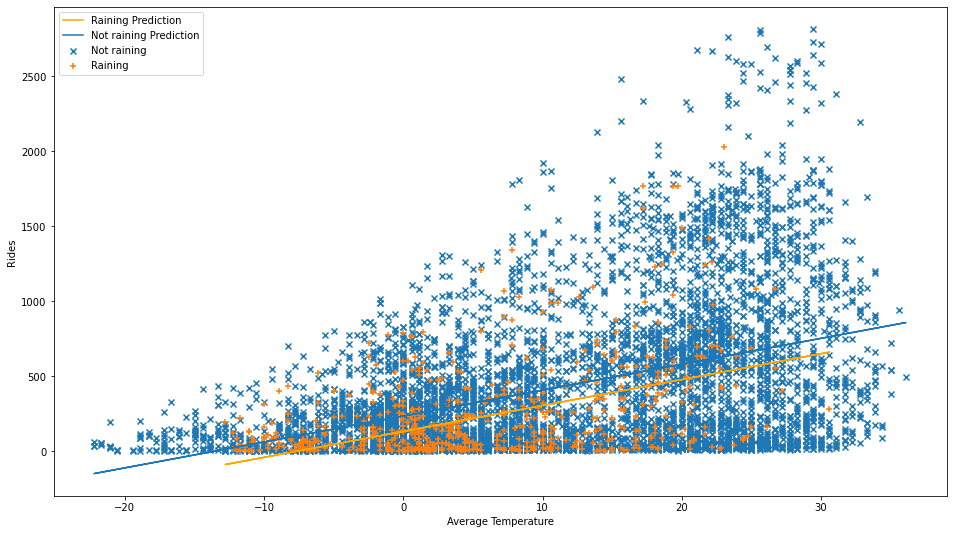

In [39]:
X_raining = x_train2[x_train2["is_raining"]==1]
X_nraining = x_train2[x_train2["is_raining"]==0]

y_pred_raining = lin_mod_day.predict(X_raining)
y_pred_nraining = lin_mod_day.predict(X_nraining)

plt.figure(figsize = (16,9))

plt.scatter(X_nraining["avg_tmp"], 
            y_train[x_train2["is_raining"]==False]["Rides"], 
            marker="x", label="Not raining")

plt.scatter(X_raining["avg_tmp"], 
            y_train[x_train2["is_raining"]==True]["Rides"], 
            marker="+", label="Raining")


plt.plot(X_raining["avg_tmp"], 
         y_pred_raining,color="orange", 
         label="Raining Prediction")

plt.plot(X_nraining["avg_tmp"], 
         y_pred_nraining, 
         label="Not raining Prediction")

plt.xlabel("Average Temperature")
plt.ylabel("Rides")

plt.legend()
plt.show()

Ignore everything above, now the correct stuff

In [40]:
lin_mod = LinearRegression()
lin_mod.fit(x_train,y_train)
print(lin_mod_day.coef_, lin_mod_day.intercept_)

v = x_test.values
y_true = y_test
y_pred = lin_mod.predict(v)

[[-102.38174016   17.27035431]] [233.14132173]


In [41]:
print("Mean Squared Error:",mean_squared_error(y_pred, y_true),"Rides^2")
print("Root Mean Squared Error:",mean_squared_error(y_pred, y_true)**0.5,"Rides")
print("Mean Absolute Error:",mean_absolute_error(y_pred, y_true),"Rides")
print("Coefficient of determination:",r2_score(y_pred, y_true))

Mean Squared Error: 29083.201850240657 Rides^2
Root Mean Squared Error: 170.53797773587166 Rides
Mean Absolute Error: 114.02993986588919 Rides
Coefficient of determination: 0.8530975834859946


Let's try to get a better R^2 score by reducing the input features

In [42]:
# split the data with 70-30% split as above

X = Features[Features.columns[(Features.columns != "Rides") & (Features.columns != "start_time") & (Features.columns != "Rides_last_hour")]]
y = Features[["Rides"]]
X,y
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=42)
X

,avg_tmp,is_raining,is_workday,season__1,season__2,season__3,hour__0,hour__1,hour__2,hour__3,...,hour__13,hour__14,hour__15,hour__16,hour__17,hour__18,hour__19,hour__20,hour__21,hour__22
0,-13.90,0,1,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,-15.00,0,1,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,-15.60,0,1,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,-16.70,0,1,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,-17.20,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9356,3.30,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
9357,3.60,1,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9358,3.45,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9359,3.30,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [43]:
lin_mod = LinearRegression()
lin_mod.fit(x_train,y_train)
print(lin_mod_day.coef_, lin_mod_day.intercept_)

v = x_test.values
y_true = y_test
y_pred = lin_mod.predict(v)

[[-102.38174016   17.27035431]] [233.14132173]


In [44]:
print("Mean Squared Error:",mean_squared_error(y_pred, y_true),"Rides^2")
print("Root Mean Squared Error:",mean_squared_error(y_pred, y_true)**0.5,"Rides")
print("Mean Absolute Error:",mean_absolute_error(y_pred, y_true),"Rides")
print("Coefficient of determination:",r2_score(y_pred, y_true))

Mean Squared Error: 79637.98563905625 Rides^2
Root Mean Squared Error: 282.2020298280228 Rides
Mean Absolute Error: 203.3457951548289 Rides
Coefficient of determination: 0.47702727402228184


In this particular feature configuartion, leaving out the rides_last_hour feature significantly decreases the R^2 score by around 38 percentage points. Thus let's try some more configurations.

In [45]:
# split the data with 70-30% split as above

X = Features[Features.columns[(Features.columns != "Rides") & (Features.columns != "start_time") & (Features.columns != "is_workday")]]
y = Features[["Rides"]]
X,y
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=42)
X

,Rides_last_hour,avg_tmp,is_raining,season__1,season__2,season__3,hour__0,hour__1,hour__2,hour__3,...,hour__13,hour__14,hour__15,hour__16,hour__17,hour__18,hour__19,hour__20,hour__21,hour__22
0,7,-13.90,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,7,-15.00,0,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,15,-15.60,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,10,-16.70,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,2,-17.20,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9356,45,3.30,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
9357,41,3.60,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
9358,28,3.45,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
9359,22,3.30,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [46]:
lin_mod = LinearRegression()
lin_mod.fit(x_train,y_train)
print(lin_mod_day.coef_, lin_mod_day.intercept_)

v = x_test.values
y_true = y_test
y_pred = lin_mod.predict(v)

[[-102.38174016   17.27035431]] [233.14132173]


In [47]:
print("Mean Squared Error:",mean_squared_error(y_pred, y_true),"Rides^2")
print("Root Mean Squared Error:",mean_squared_error(y_pred, y_true)**0.5,"Rides")
print("Mean Absolute Error:",mean_absolute_error(y_pred, y_true),"Rides")
print("Coefficient of determination:",r2_score(y_pred, y_true))

Mean Squared Error: 29240.33438601256 Rides^2
Root Mean Squared Error: 170.99805374919492 Rides
Mean Absolute Error: 113.89177599090286 Rides
Coefficient of determination: 0.8522740791969015


As seen above, leaving out the is_workday feature does not affect our R^2 score that much. It only decreases it by around 0.001 percentage points.

## Polynomial Regression

In [48]:
# split the data into testing/training sets
X_train, X_test, y_train, y_test = train_test_split(Features.iloc[:, 2:], Features.iloc[:, 1], test_size=0.3)

In [49]:
#create polynomial linear regression object 
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(degree=3)

In [50]:
# transform data
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.fit_transform(X_test)

In [51]:
# train the model
poly_model = LinearRegression()
poly_model.fit(X_train_poly, y_train)

LinearRegression()

In [52]:
# make predictions using the testing set
y_pred = poly_model.predict(X_test_poly)

In [53]:
# evaluation metrics
print(f'Coefficient of determination: {r2_score(y_pred, y_test):.4f}')

print(f'Root mean squared error: {mean_squared_error(y_pred, y_test)**0.5:.4f}')

print(f'Mean absolute error: {mean_absolute_error(y_pred, y_test):.4f}')

Coefficient of determination: 0.9715
Root mean squared error: 77.2359
Mean absolute error: 41.1727


## RBF Regression with only numerical features

This model incorporates the input features: "avg_temperature" and "rides last hour"

In [54]:
# split the data with 70-30% split as above

X = Features_Normalized[Features_Normalized.columns[(Features_Normalized.columns != "Rides") & (Features_Normalized.columns != "start_time")]]
y = Features_Normalized["Rides"]
X,y
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=42)

In [55]:
def rbf_feat(x, mu, sig):
    rbf_f = [[(np.exp(-(np.linalg.norm(x_v - mu_v)**2 / (2 * sig**2)))) for mu_v in mu] for x_v in x.values]
    rbf_f = np.array(rbf_f)
    
    return np.hstack([rbf_f, np.ones((len(x.values),1))])

def train_rbf(x, y, n_rbf):
    
    lin_s = np.linspace(0, 1, n_rbf - 1)
    mu = [(i, j) for i in lin_s for j in lin_s]
    
    sig = 1 / (n_rbf -1)
    
    Phi = rbf_feat(x, mu, sig)
    theta = np.linalg.solve(Phi.T @ Phi, Phi.T @ y)
    return theta, mu, sig
          


xp = x_train[["avg_tmp", "Rides_last_hour"]]
yp = y_train

def predict(theta, mu, sig, x):
    return rbf_feat(x, mu, sig) @ theta

y_pred = predict(*train_rbf(xp, yp, 10), x_test[["avg_tmp", "Rides_last_hour"]])

In [56]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

In [57]:
# evaluation metrics
print(f'Coefficient of determination: {r2_score(y_pred, y_test):.4f}')

print(f'Root mean squared error: {mean_squared_error(y_pred, y_test)**0.5:.4f}')

print(f'Mean absolute error: {mean_absolute_error(y_pred, y_test):.4f}')

Coefficient of determination: 0.6962
Root mean squared error: 229.9123
Mean absolute error: 141.2160


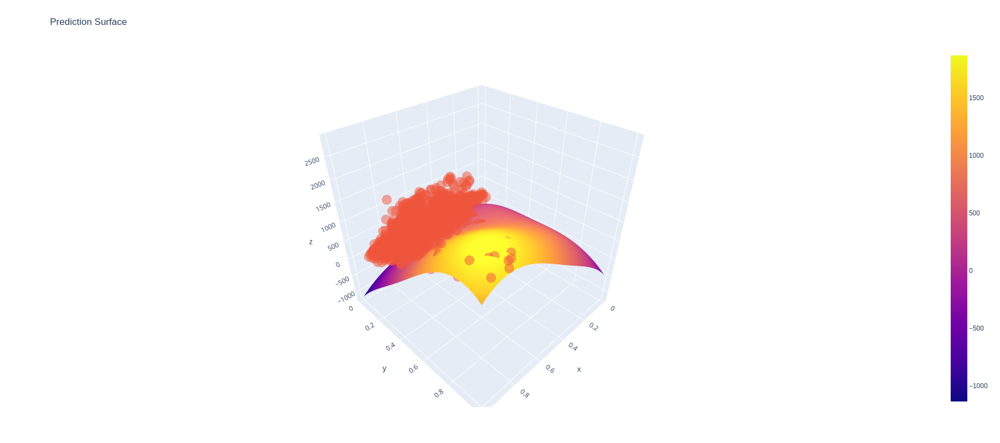

In [58]:
x, y = np.linspace(0, 1, 100), np.linspace(0, 1, 100)
t, m, s = train_rbf(xp, yp, 3)
z = [predict(t, m, s, pd.DataFrame(data = {'avg_tmp': [x_v for i in range(100)], 'Rides_last_hour': y})) for x_v in x]
fig = go.Figure(data=[go.Surface(z=z, x=x, y=y), go.Scatter3d(x=x_test["avg_tmp"], y=x_test["Rides_last_hour"], z=y_test,
                                   mode='markers', marker=dict(
        size=6,
        opacity=0.5
    ))])
fig.update_layout(title='Prediction Surface', autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

## RBF Regression Model with dummy variables

This model is identical to the previous RBF, except that we hstack the dummy variables to the end

In [59]:
def rbf_feat_with_dummies(x, mu, sig):
    rbf_subset = x[["avg_tmp", "Rides_last_hour"]]
    
    rbf_f = [[(np.exp(-(np.linalg.norm(x_v - mu_v)**2 / (2 * sig**2)))) for mu_v in mu] for x_v in rbf_subset.values]
    rbf_f = np.array(rbf_f)
    
    dummies = x[x.columns[(x.columns != "avg_tmp") & (x.columns != "Rides_last_hour")]]
    
    return np.hstack([rbf_f, np.ones((len(x.values),1)), dummies])

def train_rbf_with_dummies(x, y, n_rbf):
    
    lin_s = np.linspace(0, 1, n_rbf - 1)
    mu = [(i, j) for i in lin_s for j in lin_s]
    
    sig = 1 / (n_rbf -1)
    
    Phi = rbf_feat_with_dummies(x, mu, sig)
    theta = np.linalg.solve(Phi.T @ Phi, Phi.T @ y)
    return theta, mu, sig
          


xp = x_train
yp = y_train


def predict_with_dummies(theta, mu, sig, x):
    return rbf_feat_with_dummies(x, mu, sig) @ theta

y_pred_with_dummies = predict_with_dummies(*train_rbf_with_dummies(xp, yp, 10), x_test)

In [60]:
# evaluation metrics
print(f'Coefficient of determination: {r2_score(y_pred_with_dummies, y_test):.4f}')

print(f'Root mean squared error: {mean_squared_error(y_pred_with_dummies, y_test)**0.5:.4f}')

print(f'Mean absolute error: {mean_absolute_error(y_pred_with_dummies, y_test):.4f}')

Coefficient of determination: 0.8666
Root mean squared error: 164.7457
Mean absolute error: 107.1634


## Comparison

In [61]:
def mse_wd(n_rbf):
    xp = x_train
    yp = y_train
    theta, mu, sig = train_rbf_with_dummies(xp, yp, n_rbf)
    
    y_pred = rbf_feat_with_dummies(x_test, mu, sig) @ theta
    return mean_squared_error(y_pred, y_test)



N = np.linspace(1, 15, 15, dtype=int)
MSE_WD = [mse_wd(n_rbf) for n_rbf in N]

<ipython-input-59-66c1de4a6a04>:16: RuntimeWarning:

divide by zero encountered in long_scalars



In [62]:
def mse(n_rbf):
    xp =  x_train[["avg_tmp", "Rides_last_hour"]]
    yp = y_train
    theta, mu, sig = train_rbf(xp, yp, n_rbf)
    
    y_pred = rbf_feat(x_test[["avg_tmp", "Rides_last_hour"]], mu, sig) @ theta
    print(n_rbf)
    return mean_squared_error(y_pred, y_test)

MSE = [mse(n_rbf) for n_rbf in N]

<ipython-input-55-e259f60ade61>:12: RuntimeWarning:

divide by zero encountered in long_scalars



1
2
3
4
5
6
7
8
9
10
11
12
13
14
15


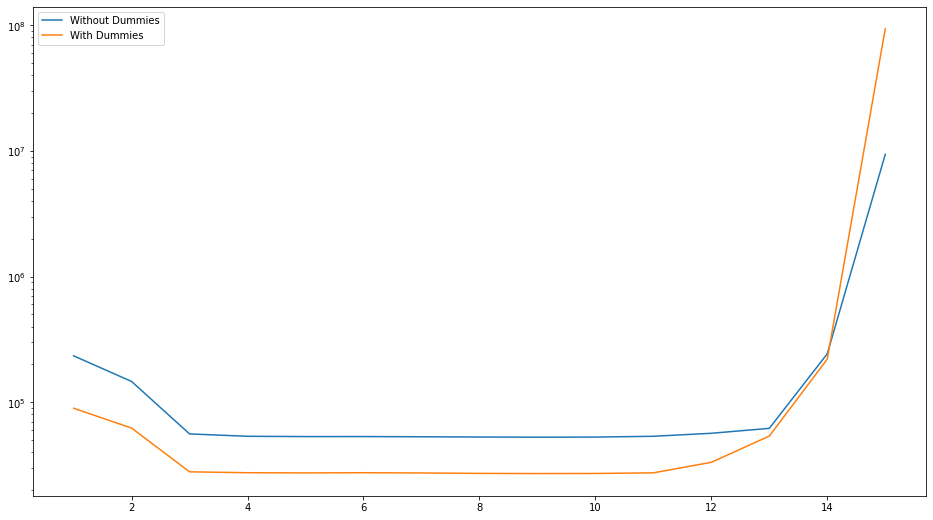

In [63]:
plt.figure(figsize = (16, 9))
plt.yscale("log")
plt.plot(N, MSE)
plt.plot(N, MSE_WD)
plt.legend(["Without Dummies", "With Dummies"])

In [64]:
np.array(MSE) ** 0.5

array([ 484.07226204,  382.66258176,  236.66304826,  231.58523552,
        230.98364733,  231.01682605,  230.56510742,  230.04179842,
        229.7246916 ,  229.91226546,  231.61472143,  238.06874834,
        249.03497796,  493.17367954, 3063.41179036])

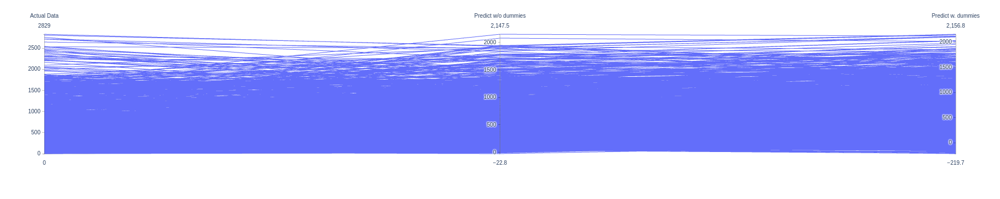

In [65]:
fig = px.parallel_coordinates(data_frame = pd.DataFrame(data={ 'Actual Data': y_test, 'Predict w/o dummies': y_pred, 'Predict w. dummies': y_pred_with_dummies}))

fig.show()